In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries

In [ ]:
# Define the classes explicitly
class_names = {
    0: 'Apple___Apple_scab', 1: 'Apple___Black_rot', 2: 'Apple___Cedar_apple_rust', 3: 'Apple___healthy', 
    4: 'Blueberry___healthy', 5: 'Cherry_(including_sour)___Powdery_mildew', 6: 'Cherry_(including_sour)___healthy', 
    7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 8: 'Corn_(maize)___Common_rust_', 9: 'Corn_(maize)___Northern_Leaf_Blight', 
    10: 'Corn_(maize)___healthy', 11: 'Grape___Black_rot', 12: 'Grape___Esca_(Black_Measles)', 13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 
    14: 'Grape___healthy', 15: 'Orange___Haunglongbing_(Citrus_greening)', 16: 'Peach___Bacterial_spot', 17: 'Peach___healthy', 
    18: 'Pepper,_bell___Bacterial_spot', 19: 'Pepper,_bell___healthy', 20: 'Potato___Early_blight', 21: 'Potato___Late_blight', 
    22: 'Potato___healthy', 23: 'Raspberry___healthy', 24: 'Soybean___healthy', 25: 'Squash___Powdery_mildew', 
    26: 'Strawberry___Leaf_scorch', 27: 'Strawberry___healthy', 28: 'Tomato___Bacterial_spot', 29: 'Tomato___Early_blight', 
    30: 'Tomato___Late_blight', 31: 'Tomato___Leaf_Mold', 32: 'Tomato___Septoria_leaf_spot', 
    33: 'Tomato___Spider_mites Two-spotted_spider_mite', 34: 'Tomato___Target_Spot', 35: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 
    36: 'Tomato___Tomato_mosaic_virus', 37: 'Tomato___healthy'
}

# Number of classes
num_classes = len(class_names)

In [ ]:
# Load EfficientNet model architecture and modify it
model = models.efficientnet_b0()
num_ftrs = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Linear(num_ftrs, 512),  # First fully connected layer with 512 neurons
    nn.ReLU(),                 # Activation
    nn.Dropout(p=0.5),         # Dropout to reduce overfitting
    nn.Linear(512, 256),       # Second fully connected layer
    nn.ReLU(),                 # Activation
    nn.Dropout(p=0.5),         # Dropout to reduce overfitting
    nn.Linear(256, 128),       # Third fully connected layer
    nn.ReLU(),                 # Activation
    nn.Linear(128, num_classes)  # Final layer - No Softmax here
)

In [ ]:
# Load the saved model weights
model.load_state_dict(torch.load('/mnt/d/projects/PlantVillage/Trained_model/99.63 - efficientnet_model.pth'))
model.eval()  # Set the model to evaluation mode

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Define the transformation (preprocessing) that was used during training
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Uncommented normalization step
])

In [ ]:
# Function to preprocess the image
def preprocess_image(image_path):
    img = Image.open(image_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0)  # Add batch dimension
    return img_tensor

# List all images in the selected directory for analysis
test_dir = '/mnt/d/projects/PlantVillage/test'  # Change this to your directory containing test images
image_files = [os.path.join(test_dir, img) for img in os.listdir(test_dir) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

# LIME for Image Classification
explainer = lime_image.LimeImageExplainer()

  0%|          | 0/1000 [00:00<?, ?it/s]

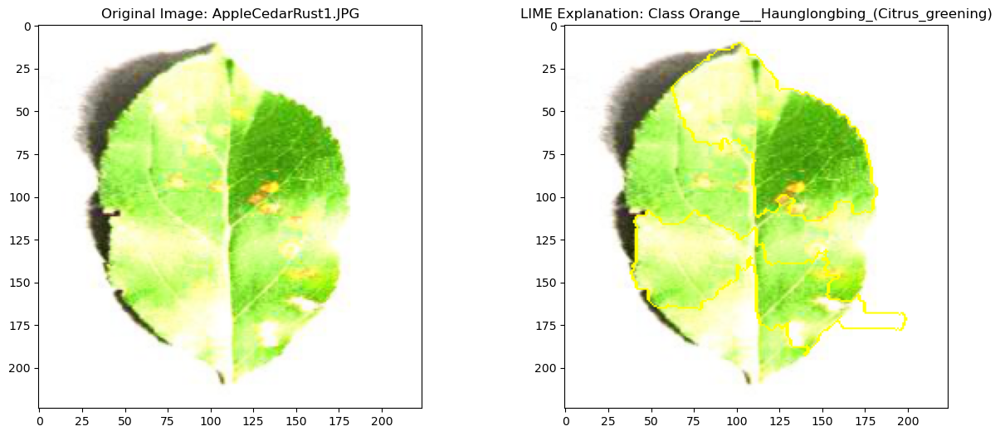

Image: AppleCedarRust1.JPG - Top predicted class: Orange___Haunglongbing_(Citrus_greening)


  0%|          | 0/1000 [00:00<?, ?it/s]

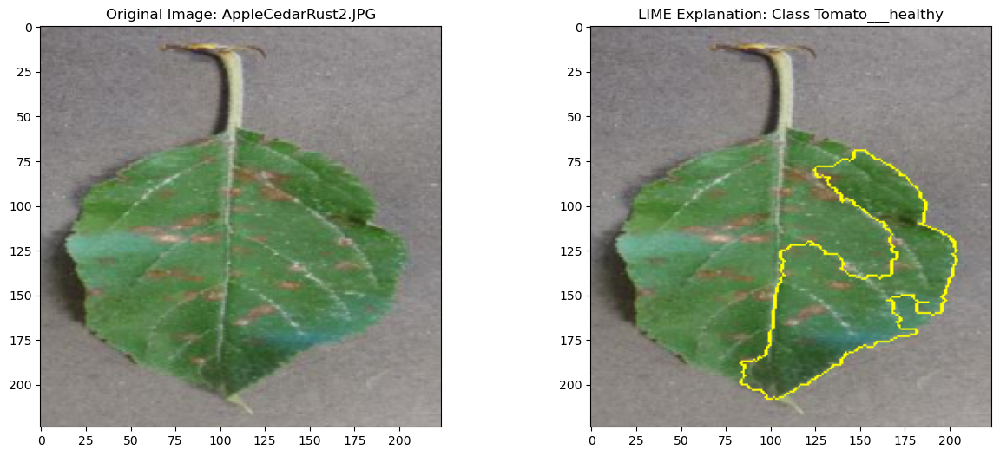

Image: AppleCedarRust2.JPG - Top predicted class: Tomato___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

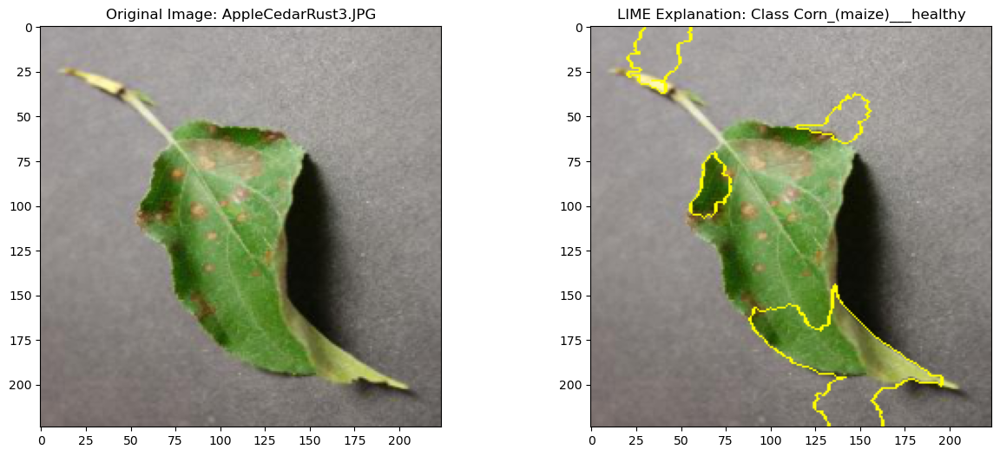

Image: AppleCedarRust3.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

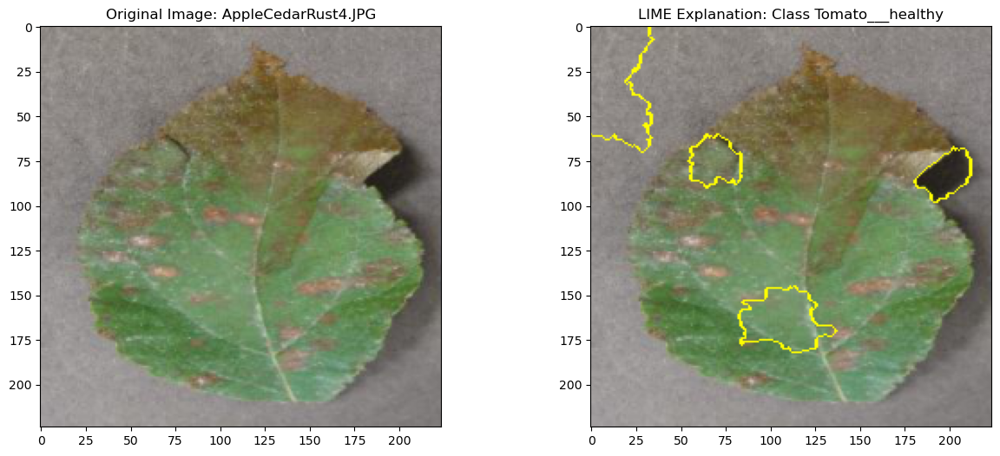

Image: AppleCedarRust4.JPG - Top predicted class: Tomato___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

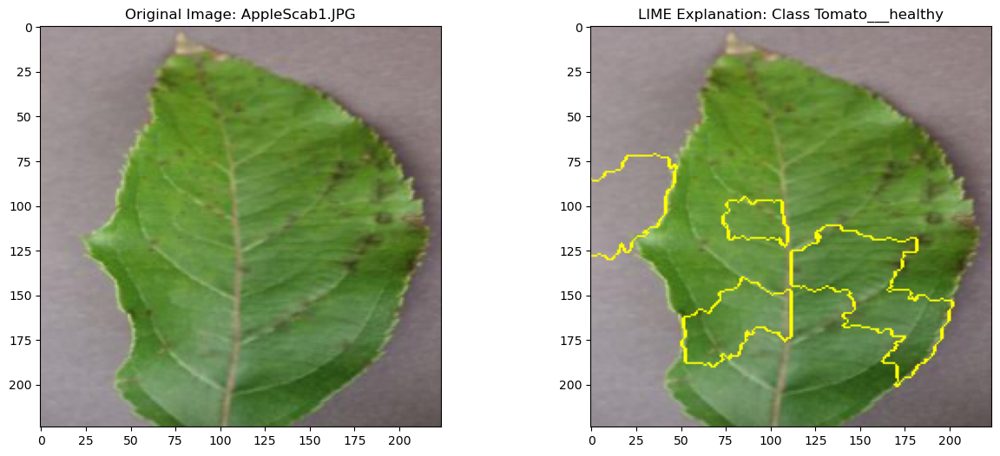

Image: AppleScab1.JPG - Top predicted class: Tomato___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

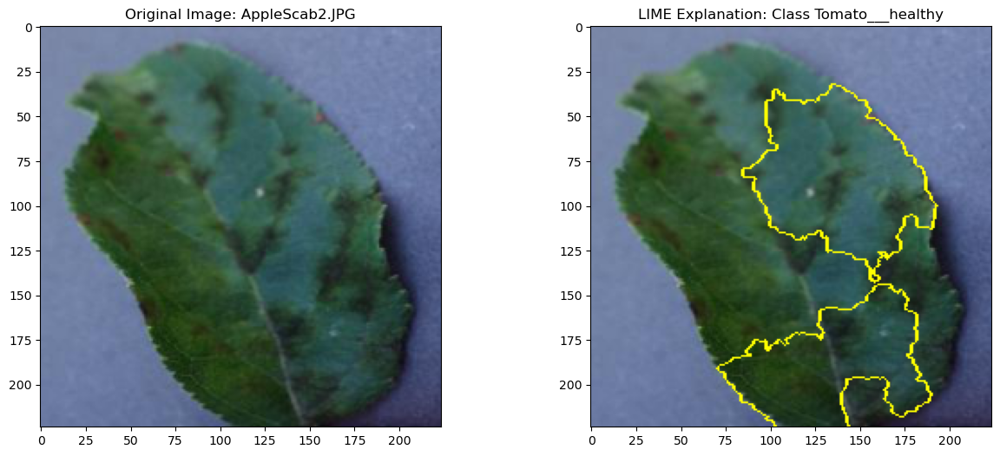

Image: AppleScab2.JPG - Top predicted class: Tomato___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

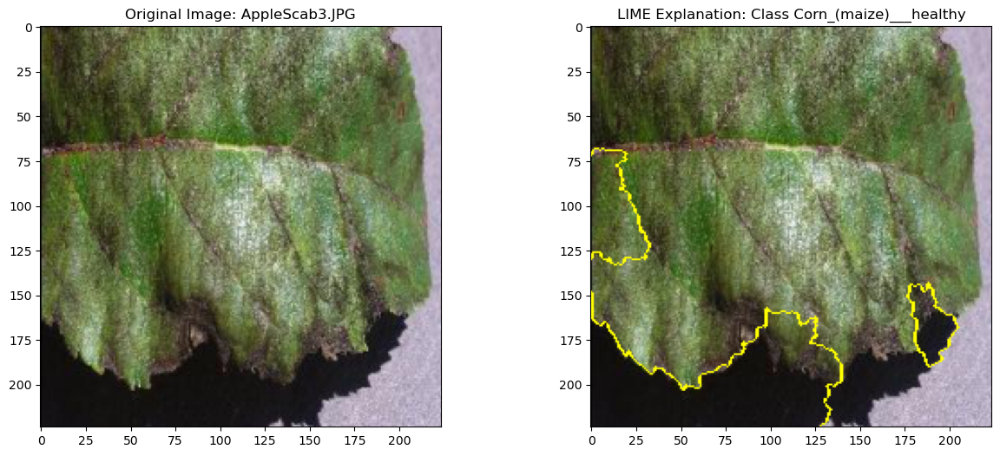

Image: AppleScab3.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

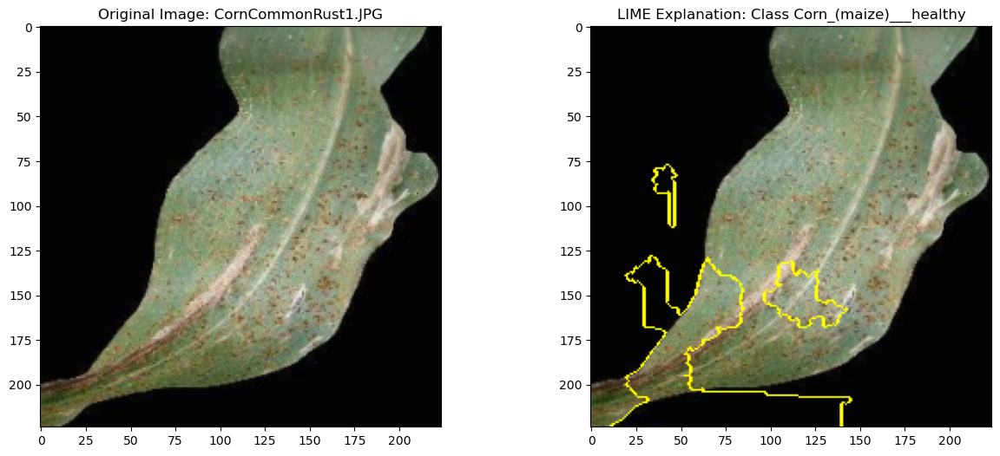

Image: CornCommonRust1.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

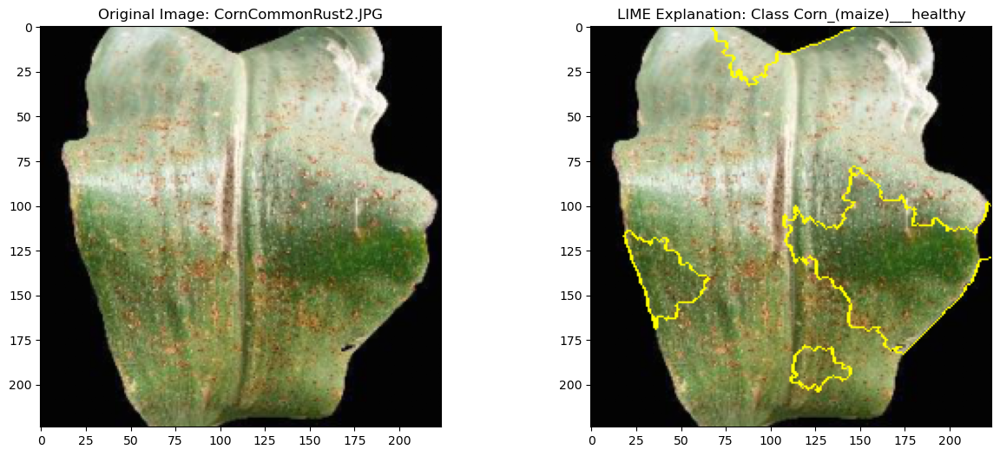

Image: CornCommonRust2.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

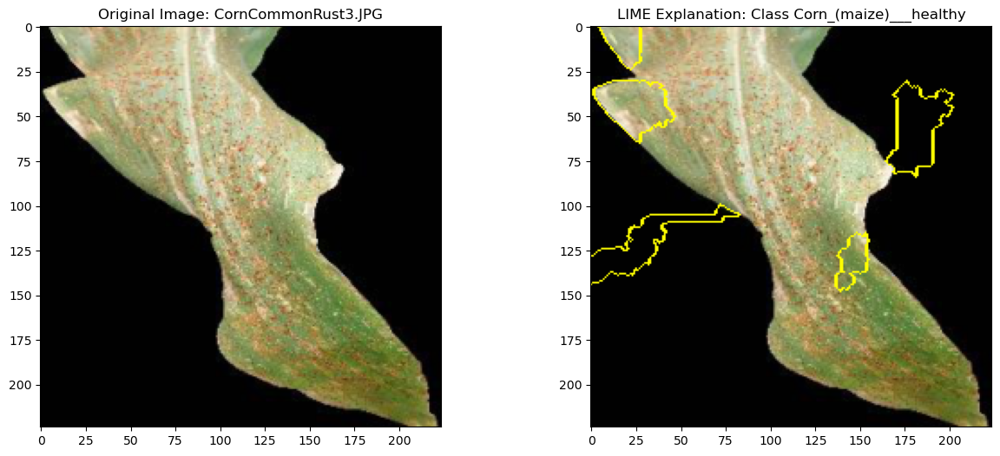

Image: CornCommonRust3.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

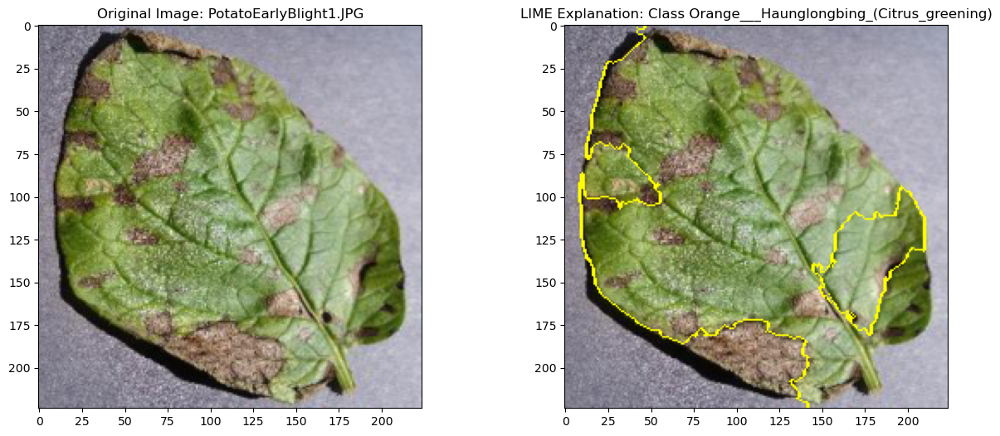

Image: PotatoEarlyBlight1.JPG - Top predicted class: Orange___Haunglongbing_(Citrus_greening)


  0%|          | 0/1000 [00:00<?, ?it/s]

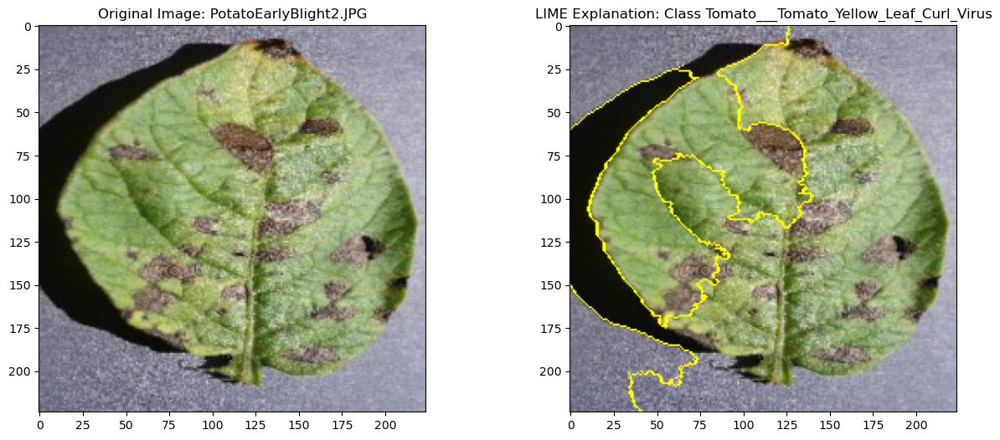

Image: PotatoEarlyBlight2.JPG - Top predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus


  0%|          | 0/1000 [00:00<?, ?it/s]

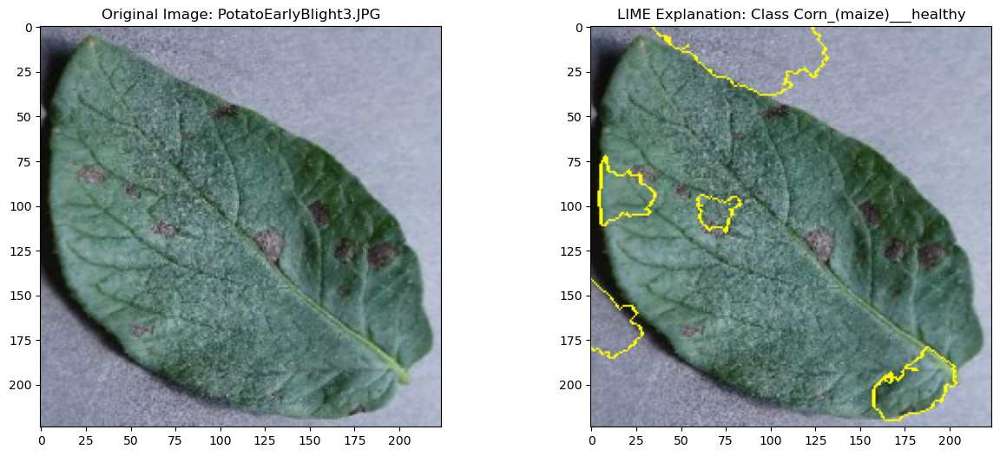

Image: PotatoEarlyBlight3.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

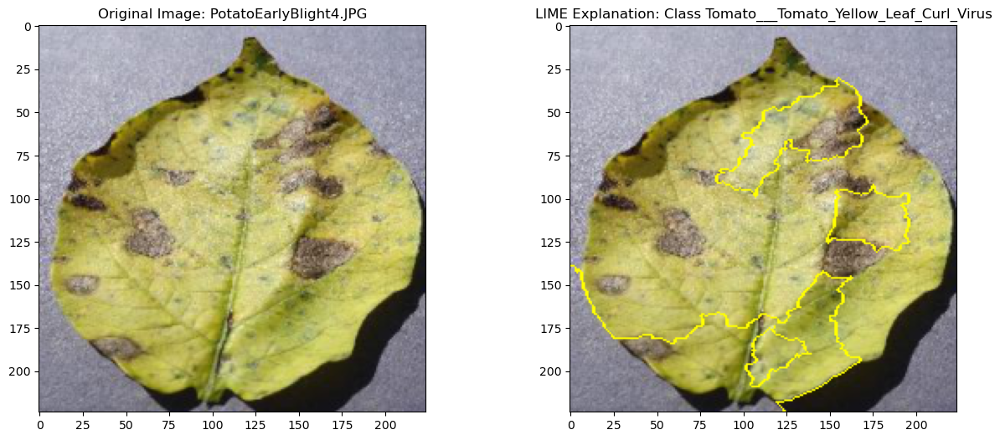

Image: PotatoEarlyBlight4.JPG - Top predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus


  0%|          | 0/1000 [00:00<?, ?it/s]

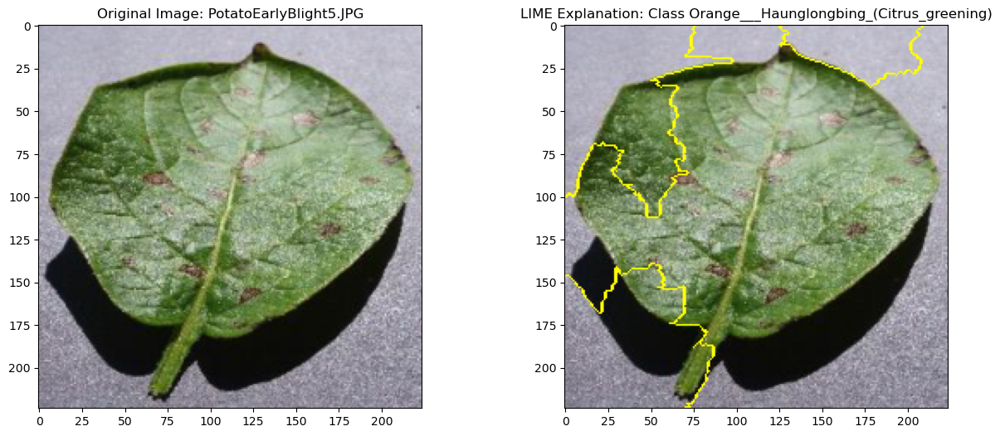

Image: PotatoEarlyBlight5.JPG - Top predicted class: Orange___Haunglongbing_(Citrus_greening)


  0%|          | 0/1000 [00:00<?, ?it/s]

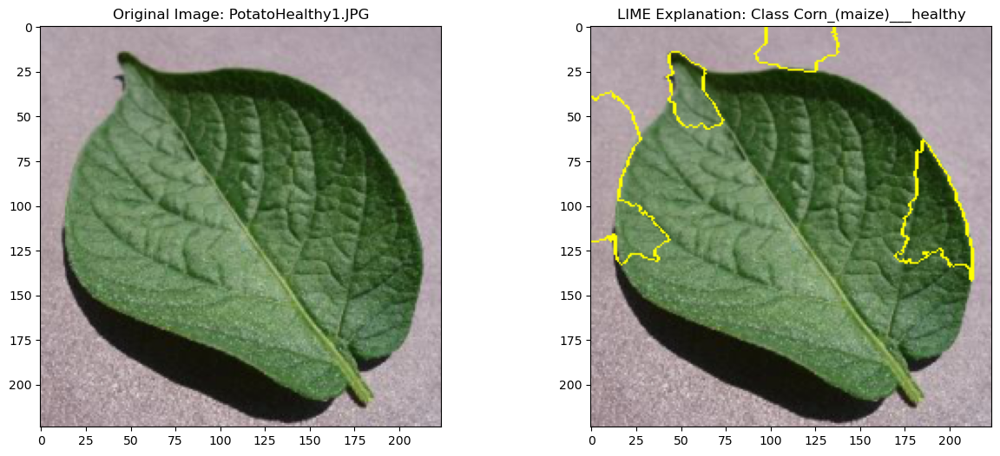

Image: PotatoHealthy1.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

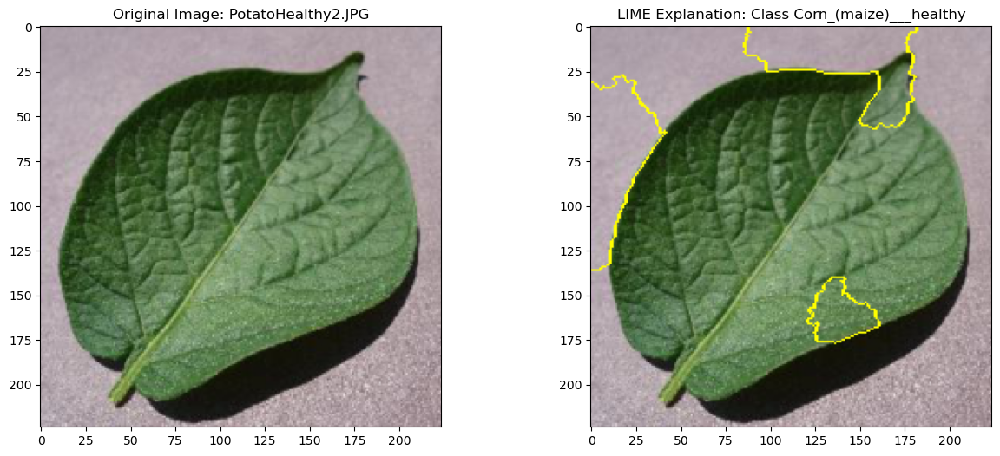

Image: PotatoHealthy2.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

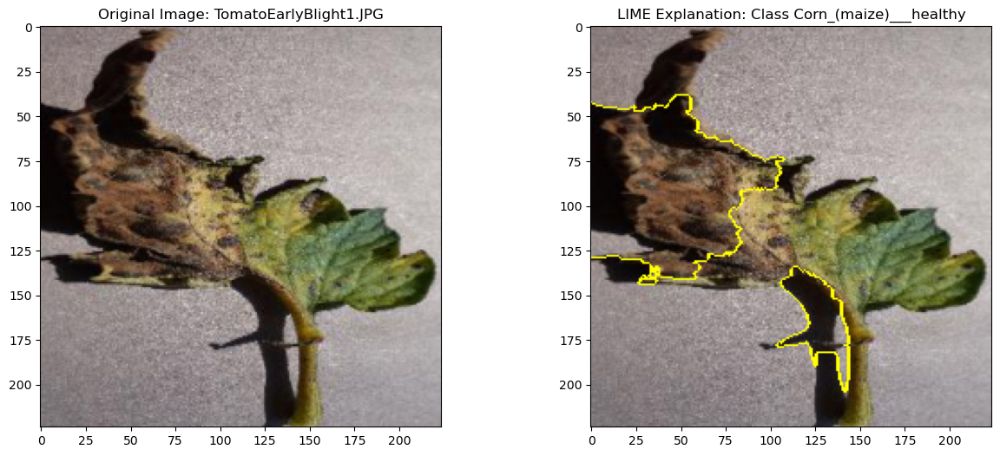

Image: TomatoEarlyBlight1.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

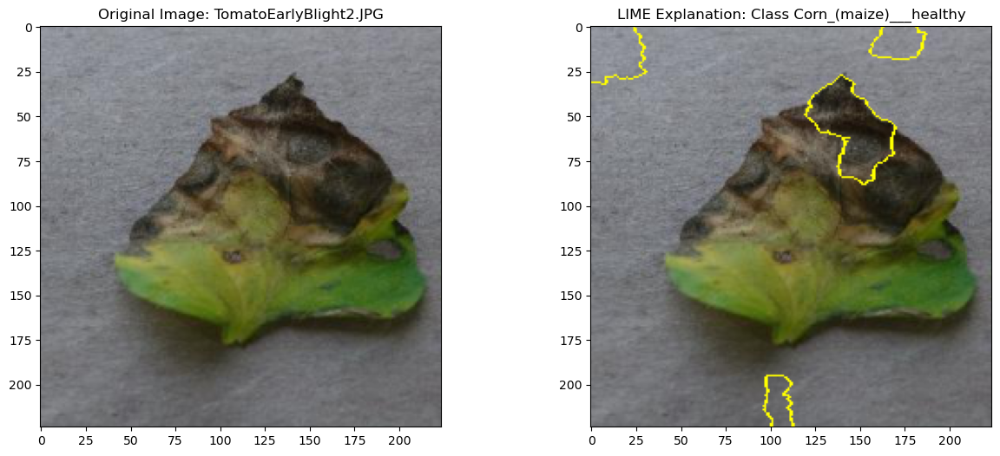

Image: TomatoEarlyBlight2.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

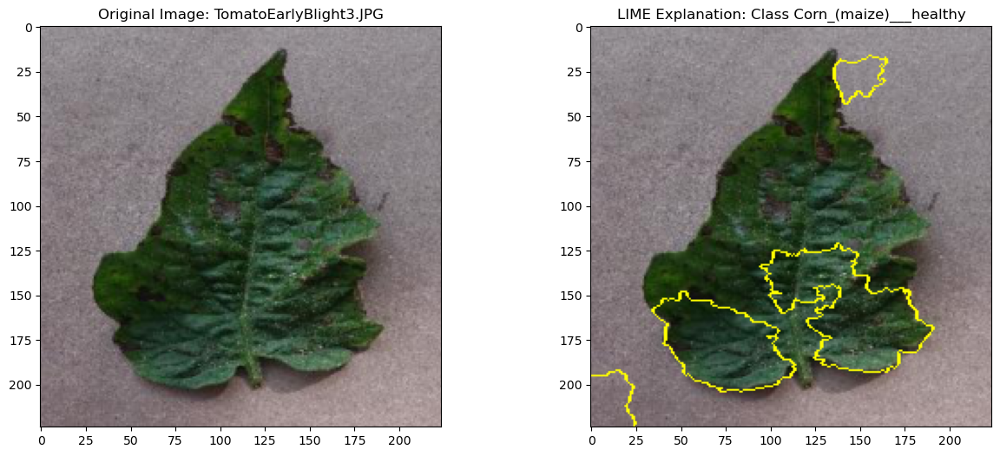

Image: TomatoEarlyBlight3.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

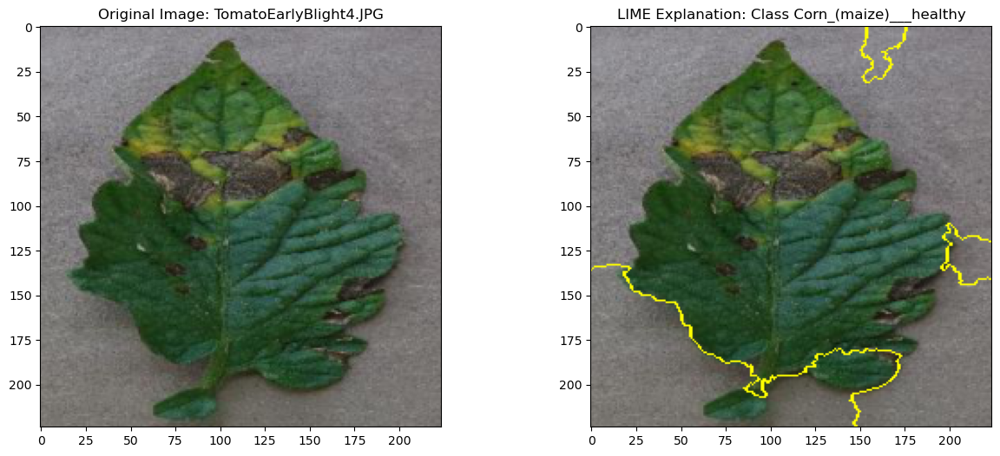

Image: TomatoEarlyBlight4.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

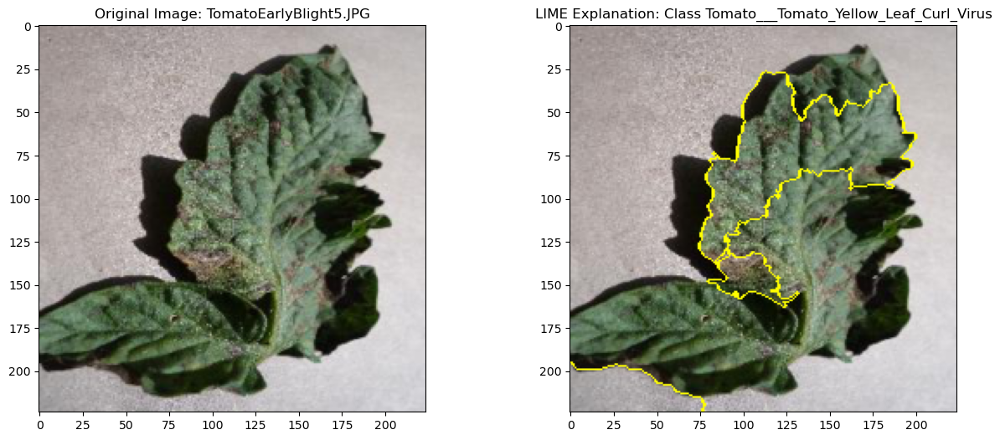

Image: TomatoEarlyBlight5.JPG - Top predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus


  0%|          | 0/1000 [00:00<?, ?it/s]

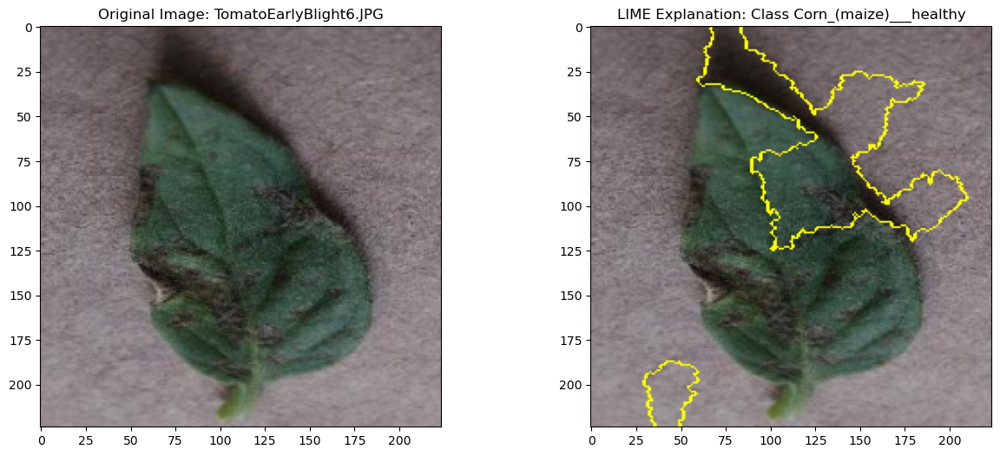

Image: TomatoEarlyBlight6.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

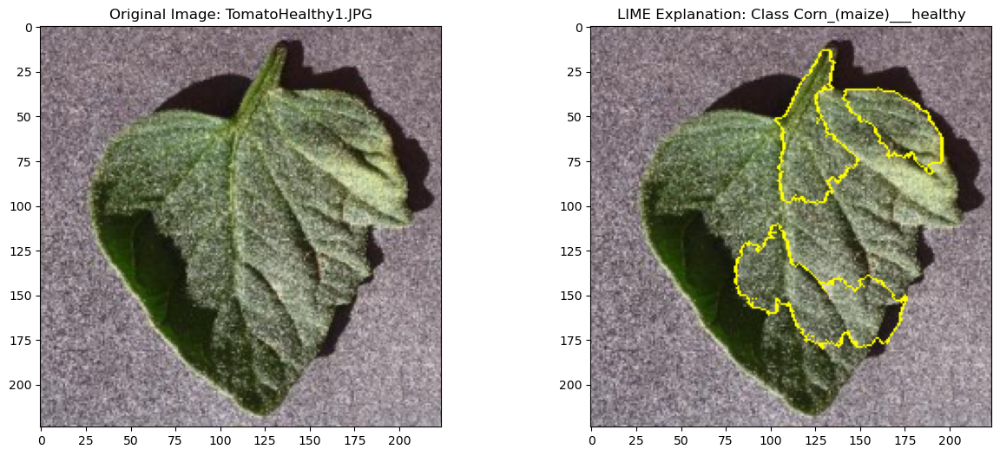

Image: TomatoHealthy1.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

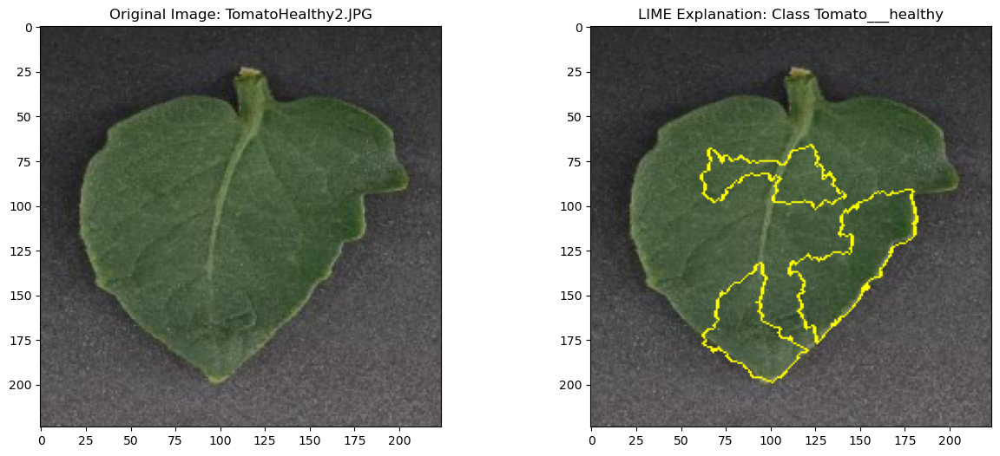

Image: TomatoHealthy2.JPG - Top predicted class: Tomato___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

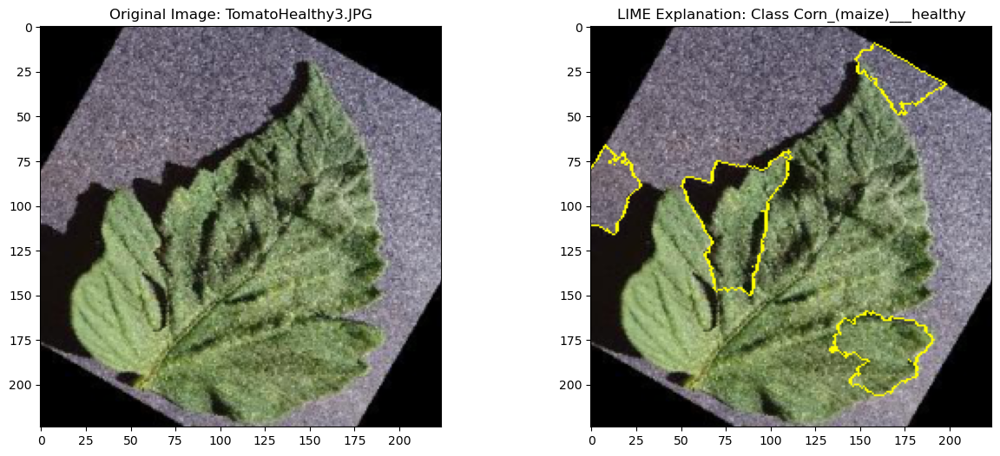

Image: TomatoHealthy3.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

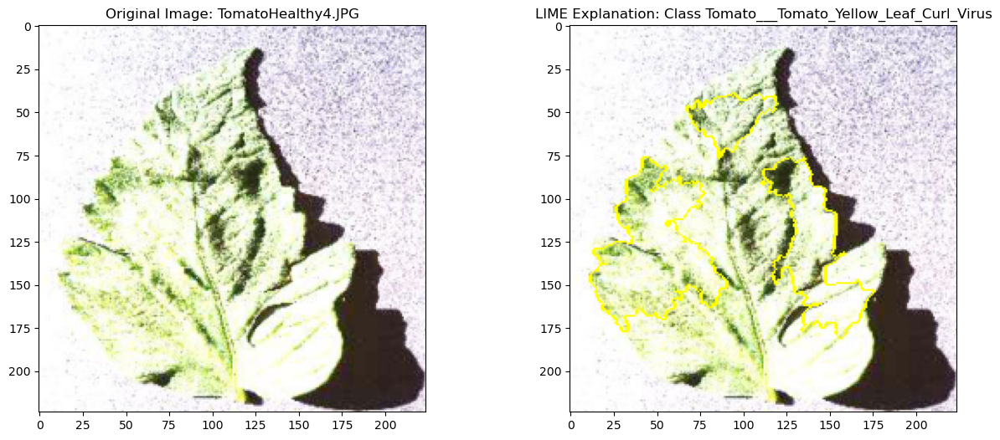

Image: TomatoHealthy4.JPG - Top predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus


  0%|          | 0/1000 [00:00<?, ?it/s]

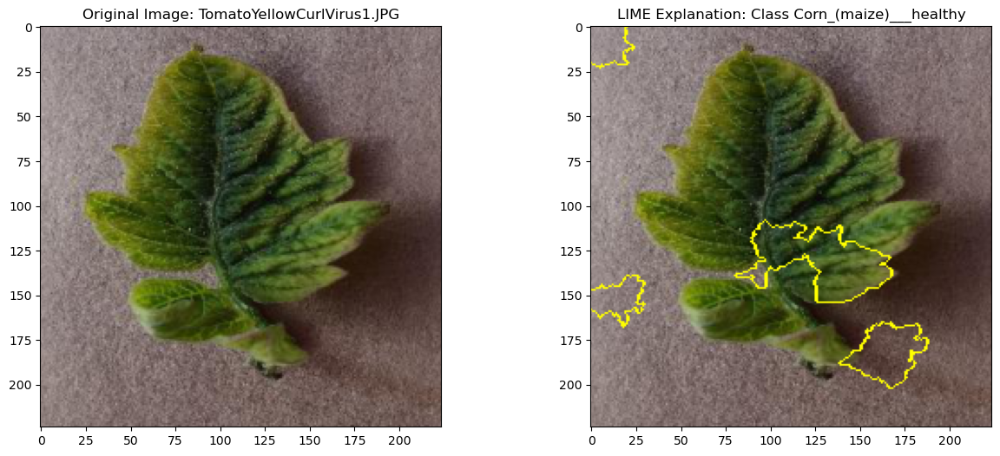

Image: TomatoYellowCurlVirus1.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

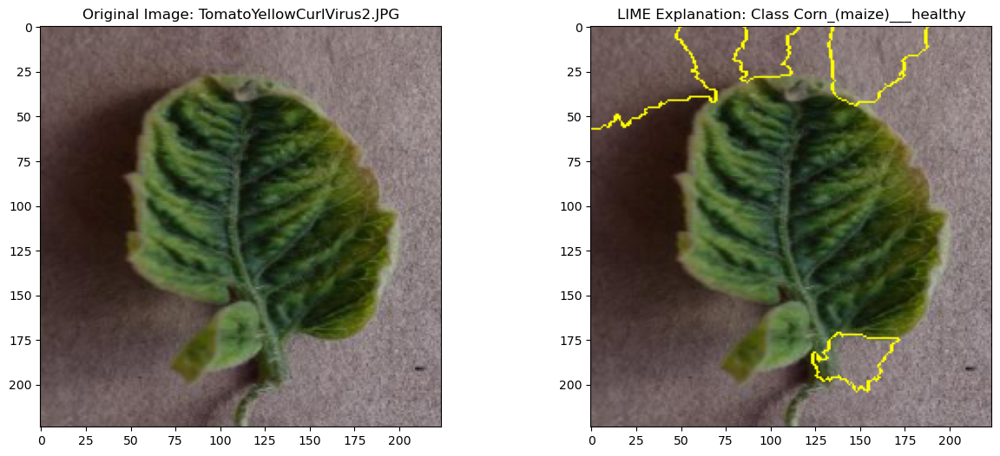

Image: TomatoYellowCurlVirus2.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

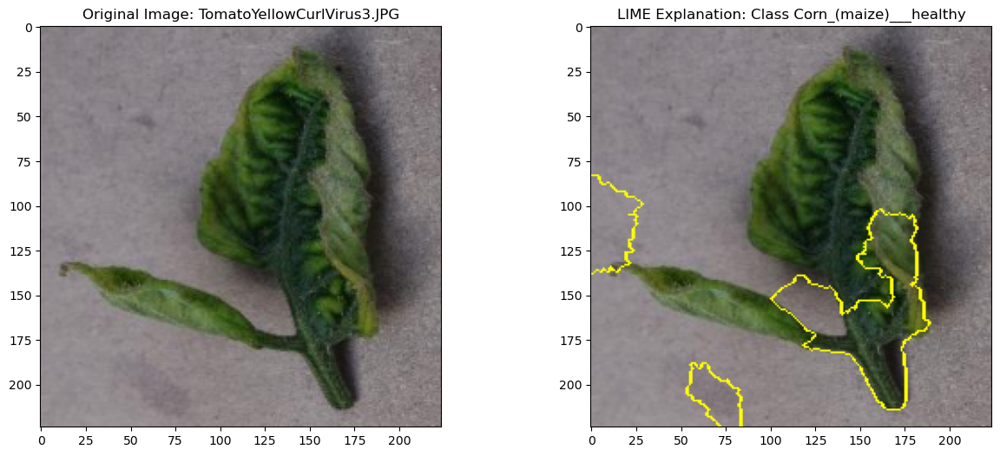

Image: TomatoYellowCurlVirus3.JPG - Top predicted class: Corn_(maize)___healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

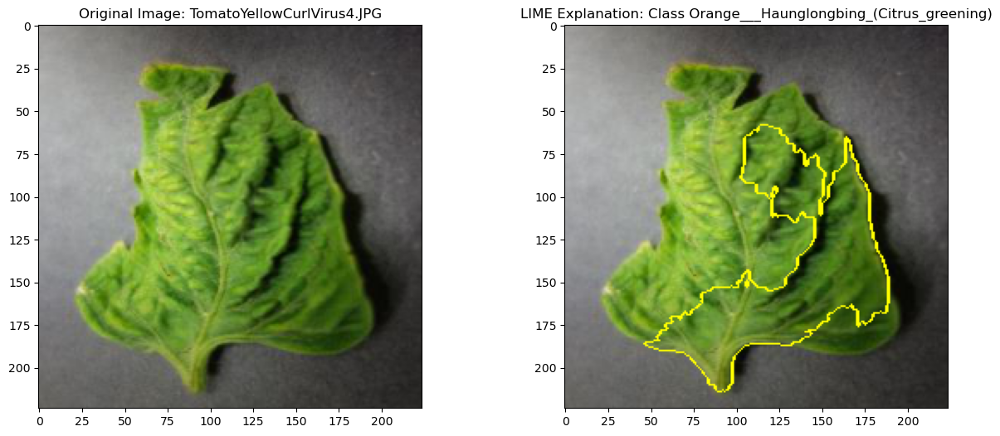

Image: TomatoYellowCurlVirus4.JPG - Top predicted class: Orange___Haunglongbing_(Citrus_greening)


  0%|          | 0/1000 [00:00<?, ?it/s]

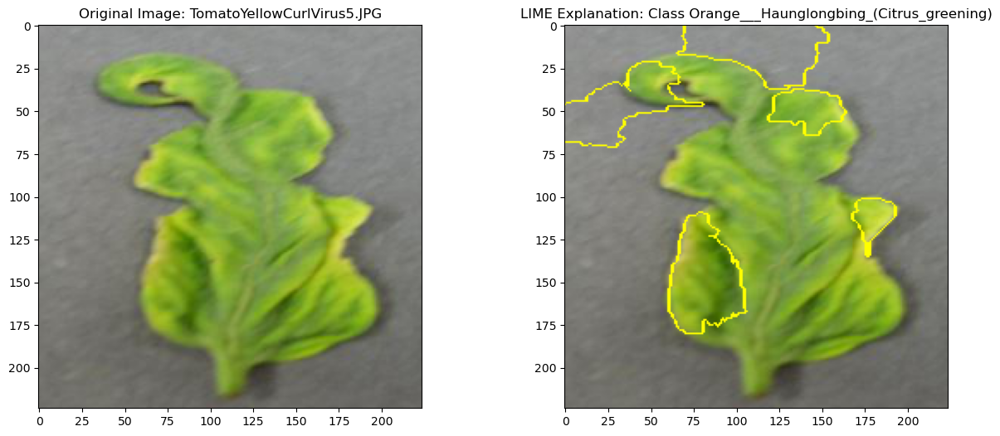

Image: TomatoYellowCurlVirus5.JPG - Top predicted class: Orange___Haunglongbing_(Citrus_greening)


  0%|          | 0/1000 [00:00<?, ?it/s]

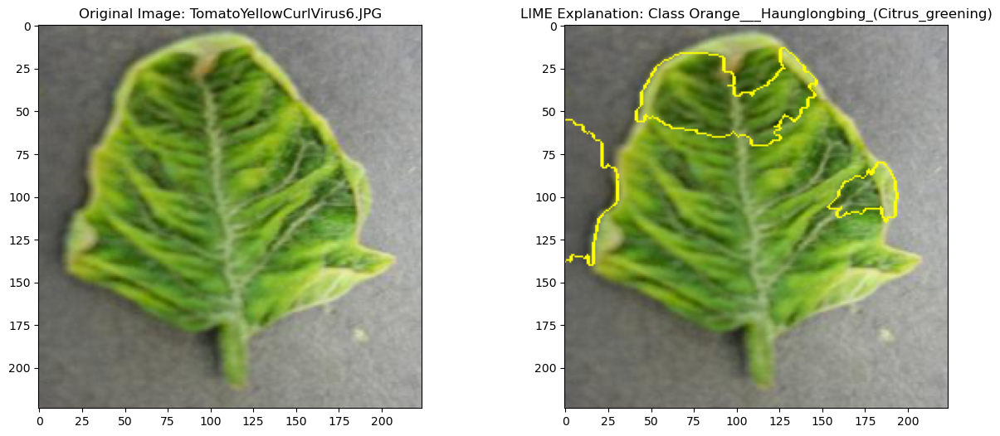

Image: TomatoYellowCurlVirus6.JPG - Top predicted class: Orange___Haunglongbing_(Citrus_greening)


In [ ]:
# Iterate over all images in the directory
for image_path in image_files:
    try:
        # Preprocess the selected image
        image_tensor = preprocess_image(image_path).to(device)

        # Convert image to numpy array for LIME
        image_np = image_tensor.cpu().numpy().transpose(0, 2, 3, 1).squeeze()

        # Define the prediction function for LIME
        def predict_fn(images):
            images = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
            model.eval()
            with torch.no_grad():
                outputs = model(images)
            return outputs.cpu().numpy()

        # Explain the image prediction using LIME
        explanation = explainer.explain_instance(image_np, predict_fn, top_labels=5, hide_color=0, num_samples=1000)

        # Get the explanation for the top predicted class
        top_pred_class = explanation.top_labels[0]
        temp, mask = explanation.get_image_and_mask(top_pred_class, positive_only=True, num_features=5, hide_rest=False)

        # Plot the original image and the LIME explanation
        fig, ax = plt.subplots(1, 2, figsize=(15, 6))
        ax[0].imshow(image_np)
        ax[0].set_title(f"Original Image: {os.path.basename(image_path)}")

        ax[1].imshow(mark_boundaries(temp, mask))
        ax[1].set_title(f"LIME Explanation: Class {class_names[top_pred_class]}")

        plt.show()

        # Print the top predicted class
        print(f"Image: {os.path.basename(image_path)} - Top predicted class: {class_names[top_pred_class]}")

    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        continue